# CosMAP compared to UMAP, PaCMAP, LocalMAP, t-SNE, ...,  using diffenret  Data

In [1]:
from cosmapdr import CosMAP
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import time
import pacmap
import umap

In [3]:
import sys
print(sys.executable)

import numpy as np
import scipy
import pandas as pd
import sklearn
import matplotlib

print("numpy:", np.__version__)
print("scipy:", scipy.__version__)
print("pandas:", pd.__version__)
print("sklearn:", sklearn.__version__)

/lustre10/scratch/fenosoa/balsac_venv/bin/python
numpy: 2.4.2
scipy: 1.17.0
pandas: 3.0.0
sklearn: 1.8.0


In [4]:
DATA_PATH=Path("/home/fenosoa/links/projects/def-amadou/fenosoa/data_benchmark")
DATA_NAME="mnist"
METHODS= [
    "cosmap_2d",
    "pacmap_2d",
    "umap_2d",
    "localmap_2d",
    "tsne_2d",
    "trimap_2d",
    "phate_2d",
    "pca_2d",
    "hnne_2d",
    "infonce_2d",
    "negtsne_2d",
    "ncvi_2d",
]

In [4]:
from pathlib import Path
from tqdm import tqdm

import benchmark_pipeline


%load_ext autoreload
%autoreload 2
from benchmark_pipeline import run_dimensionality_reduction_benchmark

In [ ]:


DATA_PATH=Path("/home/fenosoa/links/projects/def-amadou/fenosoa/data_benchmark")

DATA_NAMES = [
            "retina", 
              "cortex",
              "pbmc", 
              "paul15", 
              "fmnist", 
              "coil_20", 
              "20NG", 
              "mnist",
              "USPS", 
              "heart_cell_atlas",
              "kinship_rrq",
              "kinship_cartagene"
             ]

METHODS= [
    "pacmap_2d",
    "umap_2d",
    "localmap_2d",
    "tsne_2d",
    "trimap_2d",
    "phate_2d",
    "pca_2d",
    "hnne_2d",
    "infonce_2d",
    "negtsne_2d",
    "ncvi_2d",
    "cosmap_2d",
    
]




random_state=42

for DATA_NAME in  tqdm(DATA_NAMES, desc="Processing datasets"):
    print(DATA_NAME)
    embeddings_dict, timing_dict, output_folder = run_dimensionality_reduction_benchmark(
        data_name=DATA_NAME,
        data_path=str(DATA_PATH),
        methods_to_run=METHODS,
        random_state=random_state,
        output_dir=f"comparison_with_seed_{random_state}",
        save_individual_files=True,
        cosmap_params={
            "n_components": 2,
            "n_neighbors": 15,
            "temperature": 0.5,
            "use_gpu": 1,
            "random_state": random_state,
            "optimizer_backend": "torch_manual",
            "metric":"euclidean",
            "faiss_backend": "none",
            "refinement": True,
            "refinement_dim": 30,
            "refinement_n_neighbors": 30,
            "verbose": True,
            "metric":"cosine", 
        },
    )

: 

In [47]:
import matplotlib 
%matplotlib inline



%load_ext autoreload
%autoreload 2
from plot_all_datasets import plot_embeddings_comparison

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Plot USPS Dataset

Shape of y=(9298,) ====================
 Processing labels...
   Found 10 numerical labels after filtering: [np.int32(0), np.int32(1), np.int32(2), np.int32(3), np.int32(4), np.int32(5), np.int32(6), np.int32(7), np.int32(8), np.int32(9)]
Using tab10 colors for 10 labels...
 Created output folder: embeddings_plot_USPS_seed_2025

 Creating 3x4 comparison plot...
   Plotting CosMAP at position [0,0]
Shape of embedding_data after filtering=(9298, 2) ==================== 

   Plotting PaCMAP at position [0,1]
Shape of embedding_data after filtering=(9298, 2) ==================== 

   Plotting LocalMAP at position [0,2]
Shape of embedding_data after filtering=(9298, 2) ==================== 

   Plotting t-SNE at position [0,3]
Shape of embedding_data after filtering=(9298, 2) ==================== 

   Plotting UMAP at position [1,0]
Shape of embedding_data after filtering=(9298, 2) ==================== 

   Plotting h-NNE at position [1,1]
Shape of embedding_data after filtering=(9298, 2) =

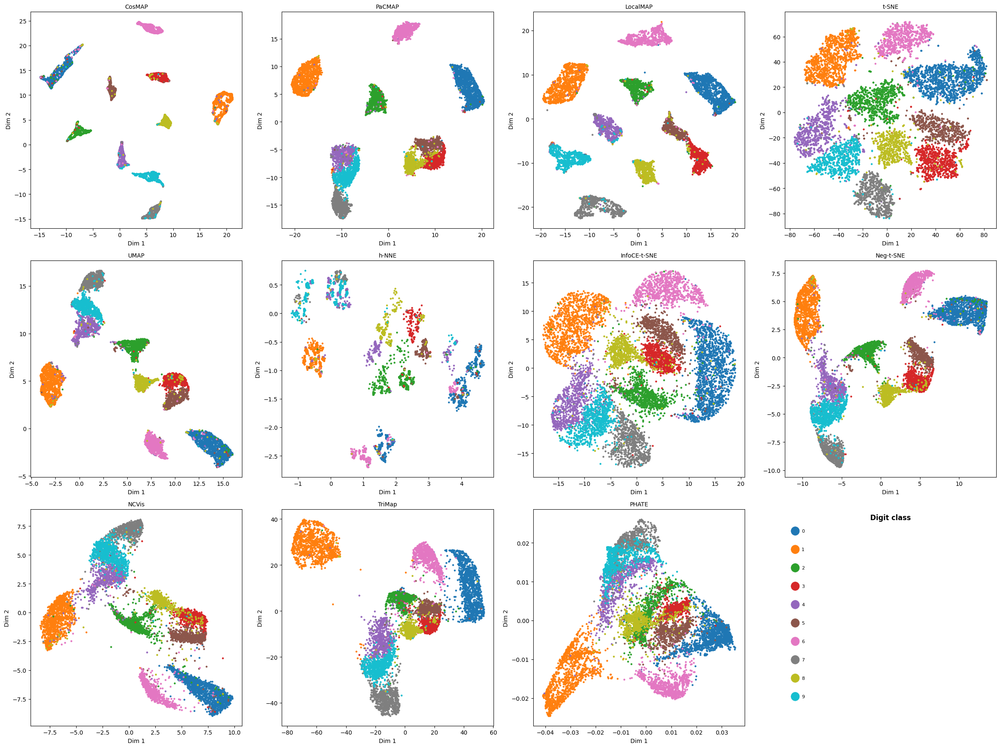


 COLOR SUMMARY:
 Legend title: Digit class
 Used tab10 colors for 10 labels


In [55]:
file_path = "v1_comparison_USPS_seed_42/all_embeddings_dict_23_USPS.npy"

embeddings_dict = np.load(
    file_path,
    allow_pickle=True
).item()
fig, output_path = plot_embeddings_comparison(
    embeddings_dict=embeddings_dict,
    data_name="USPS",
    random_state=2025,
    custom_colors=None,       # use your Cortex colors
    exclude_labels=None,
    labels_name="Digit class", #Cell type
    label_names=None,
    dpi=200,
    figure_size=(24, 18),
    point_size=5,
    save_plot=True,
    show_plot=True,
)


## Plot MNIST Dataset

Shape of y=(70000,) ====================
 Processing labels...
   Found 10 numerical labels after filtering: [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9)]
Using tab10 colors for 10 labels...
 Created output folder: embeddings_plot_mnist_seed_2025

 Creating 3x4 comparison plot...
   Plotting CosMAP at position [0,0]
Shape of embedding_data after filtering=(70000, 2) ==================== 

   Plotting PaCMAP at position [0,1]
Shape of embedding_data after filtering=(70000, 2) ==================== 

   Plotting LocalMAP at position [0,2]
Shape of embedding_data after filtering=(70000, 2) ==================== 

   Plotting t-SNE at position [0,3]
Shape of embedding_data after filtering=(70000, 2) ==================== 

   Plotting UMAP at position [1,0]
Shape of embedding_data after filtering=(70000, 2) ==================== 

   Plotting h-NNE at position [1,1]
Shape of embedding_data after filtering=(700

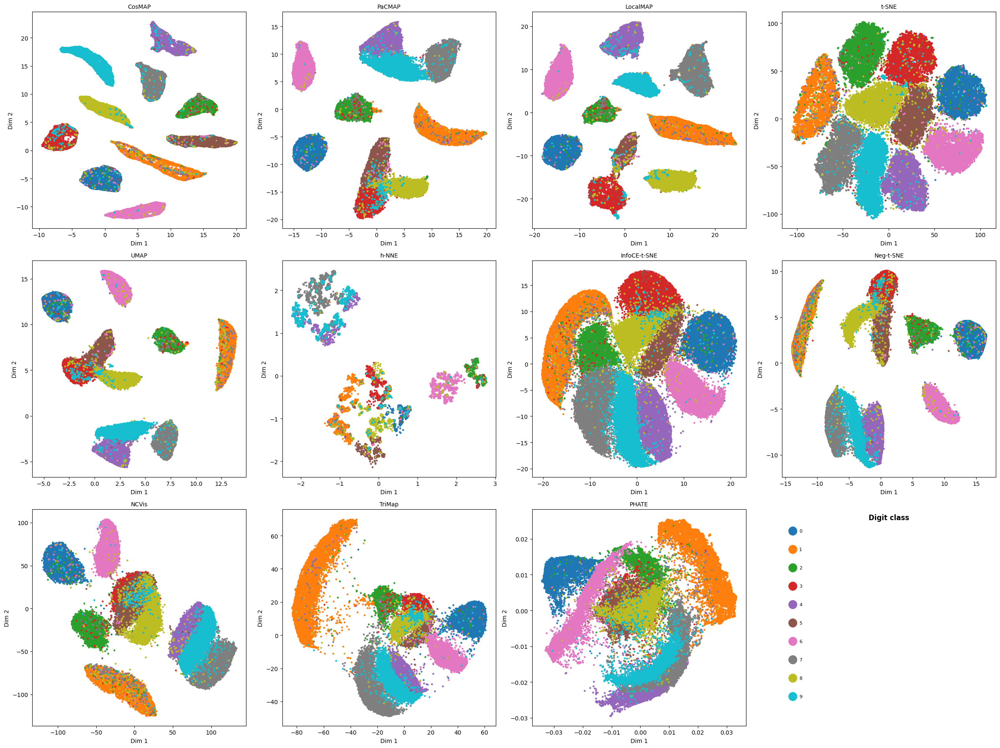


 COLOR SUMMARY:
 Legend title: Digit class
 Used tab10 colors for 10 labels


In [54]:
file_path = "v1_omparison_mnist_seed_42/all_embeddings_dict_23_mnist.npy"

embeddings_dict = np.load(
    file_path,
    allow_pickle=True
).item()
fig, output_path = plot_embeddings_comparison(
    embeddings_dict=embeddings_dict,
    data_name="mnist",
    random_state=2025,
    custom_colors=None,       # use your Cortex colors
    exclude_labels=None,
    labels_name="Digit class", #Cell type
    label_names=None,
    dpi=200,
    figure_size=(24, 18),
    point_size=5,
    save_plot=True,
    show_plot=True,
)

## Plot Retina Dataset

Shape of y=(19829,) ====================
 Processing labels...
   Found 15 categorical labels after filtering: ['BC1A', 'BC1B', 'BC2', 'BC3A', 'BC3B', 'BC4', 'BC5A', 'BC5B', 'BC5C', 'BC5D', 'BC6', 'BC7', 'BC8_9', 'MG', 'RBC']
Using CUSTOM colors for 15 labels...
    BC1A -> red
    BC1B -> black
    BC2 -> blue
    BC3A -> #D191EB
    BC3B -> magenta
    BC4 -> cyan
    BC5A -> green
    BC5B -> purple
    BC5C -> pink
    BC5D -> brown
    BC6 -> gray
    BC7 -> navy
    BC8_9 -> lightgreen
    MG -> maroon
    RBC -> orange
 Created output folder: embeddings_plot_retina_seed_2025

 Creating 3x4 comparison plot...
     Method cosmap_2d not found
     Method pacmap_2d not found
     Method localmap_2d not found
     Method tsne_2d not found
     Method umap_2d not found
     Method hnne_2d not found
   Plotting InfoCE-t-SNE at position [1,2]
Shape of embedding_data after filtering=(19829, 2) ==================== 

   Plotting Neg-t-SNE at position [1,3]
Shape of embedding_data after fi

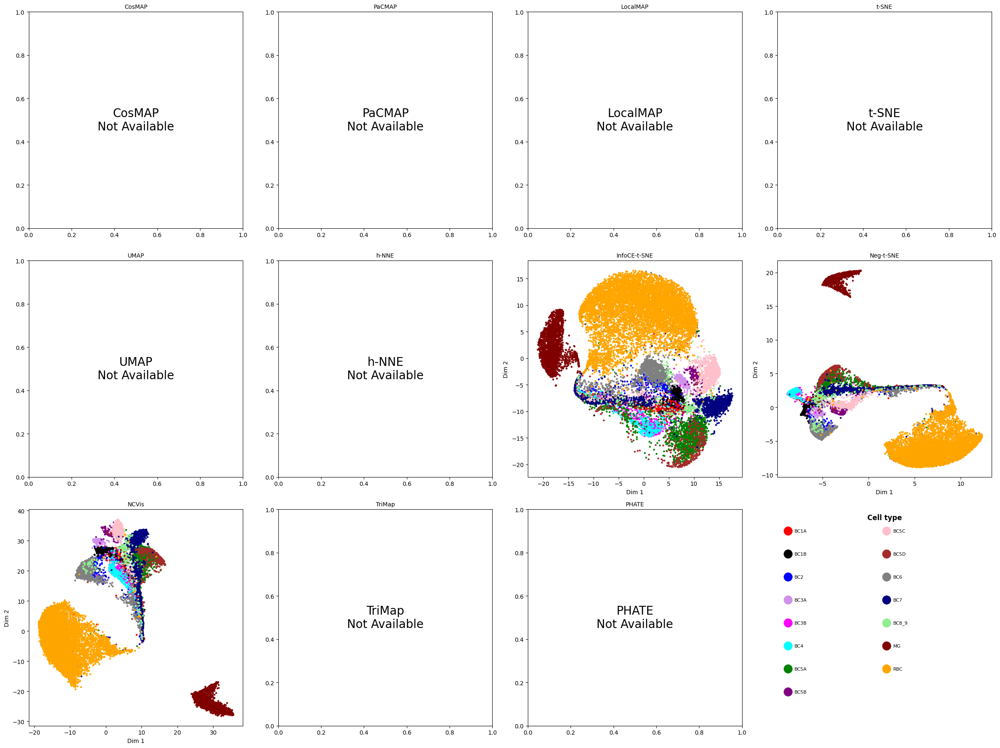


 COLOR SUMMARY:
 Legend title: Cell type
 Used custom colors for 15 labels
   BC1A -> red
   BC1B -> black
   BC2 -> blue
   BC3A -> #D191EB
   BC3B -> magenta
   BC4 -> cyan
   BC5A -> green
   BC5B -> purple
   BC5C -> pink
   BC5D -> brown
   BC6 -> gray
   BC7 -> navy
   BC8_9 -> lightgreen
   MG -> maroon
   RBC -> orange


In [59]:
file_path = "v1_comparison_retina_seed_42/all_embeddings_dict_42_retina.npy"

embeddings_dict = np.load(
    file_path,
    allow_pickle=True
).item()

RETINA_COLORS = {
    "BC1A": "red", "BC1B": "black", "BC2": "blue", "BC3A": "#D191EB",
    "BC3B": "magenta", "BC4": "cyan", "BC5A": "green", "BC5B": "purple",
    "BC5C": "pink", "BC5D": "brown", "BC6": "gray", "BC7": "navy",
    "BC8_9": "lightgreen", "MG": "maroon", "RBC": "orange"
}
fig, output_path = plot_embeddings_comparison(
    embeddings_dict=embeddings_dict,
    data_name="retina",
    random_state=2025,
    custom_colors=RETINA_COLORS,       # use your Cortex colors
    exclude_labels=None,
    labels_name="Cell type", #Cell type
    label_names=None,
    dpi=200,
    figure_size=(24, 18),
    point_size=5,
    save_plot=True,
    show_plot=True,
)

In [12]:
import sys
# sys.path.append("/path/to/the/folder/containing/bench_mark.py")
from plot_benchmark_specific_methods import plot_embeddings_comparison

In [14]:
embeddings_dict=np.load("v1_omparison_mnist_seed_42/all_embeddings_dict_42_mnist.npy",allow_pickle=True).item()

In [15]:
embeddings_dict.keys()

dict_keys(['X_mnist', 'labels_mnist', 'X', 'labels', 'cosmap_2d', 'infonce_2d', 'negtsne_2d', 'ncvi_2d'])

Methods to plot (4): ['cosmap_2d', 'negtsne_2d', 'ncvi_2d', 'infonce_2d']
Excluded labels: None
Found 10 numerical labels.
Grid: 2 x 3 | legend mode: inside
Plotting cosmap_2d as CosMAP
Plotting negtsne_2d as Neg-t-SNE
Plotting ncvi_2d as NCVis
Plotting infonce_2d as InfoCE-t-SNE
Saved plot: embeddings_plot_mnist_seed_2025_20260527_135822/embeddings_mnist_seed_2025_4methods.png


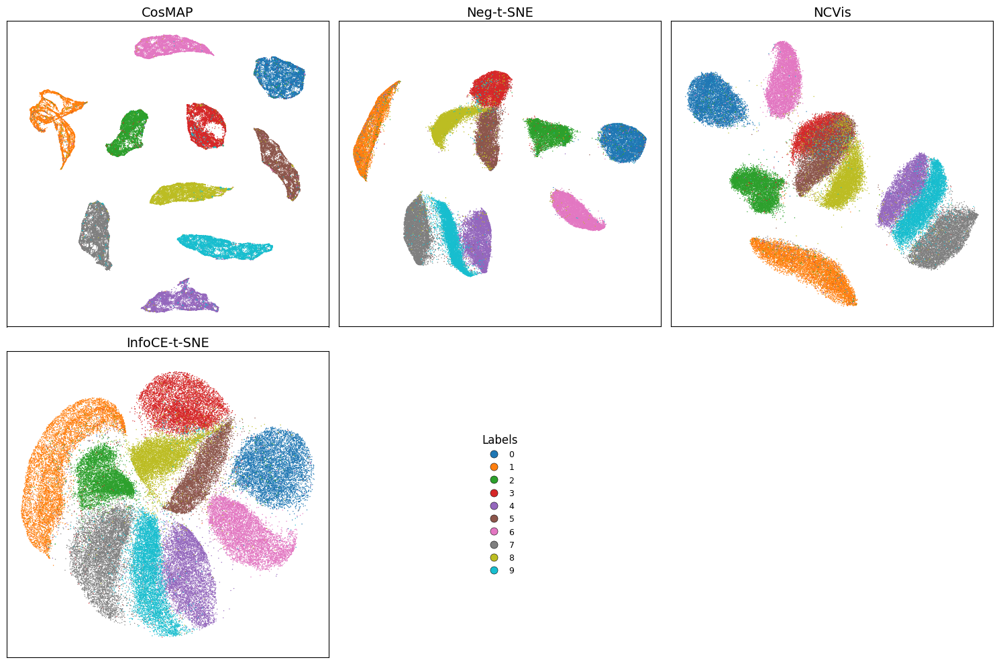

In [17]:
methods_to_plot=[
"cosmap_2d",
"negtsne_2d",
"ncvi_2d",
"infonce_2d",]
# "trimap_2d",
# "phate_2d",
# "pca_2d",
# "hnne_2d",
# "negtsne_2d",
# "ncvi_2d",
# ],
fig, output_path = plot_embeddings_comparison(
    embeddings_dict,
    data_name="mnist",
    methods_to_plot=methods_to_plot,
    show_legend=True,
    legend_mode="auto",
    legend_show_count=False,
    method_title_fontsize=14,
    method_title_fontweight="normal",
    point_size=1,
)

In [ ]:
import numpy as np
from pathlib import Path

from bench_mark import plot_embeddings_comparison


# ============================================================
# 1. CONFIGURATION
# ============================================================

MAIN_PATH = Path("Cosmap_comparison_kinship_cartagene_seed_42")
DATA_NAME = "kinship_cartagene"
SEED = 42

EMBEDDINGS_FILE = MAIN_PATH / f"all_embeddings_dict_{SEED}_{DATA_NAME}.npy"

print(f"Loading embeddings from:\n{EMBEDDINGS_FILE}")

embeddings_dict = np.load(EMBEDDINGS_FILE, allow_pickle=True).item()

print("Available keys:")
for key in embeddings_dict.keys():
    print("  -", key)


# ============================================================
# 2. OPTIONAL: CUSTOM COLORS FOR KINSHIP REGIONS
# ============================================================

# If your kinship labels have more than 10 classes, your function requires
# custom_colors. Replace these labels by your real RegionLabel values.
KINSHIP_COLORS = {
    "Abitibi": "#1f77b4",
    "Agglomération de Québec": "#ff7f0e",
    "Bas-Saint-Laurent": "#2ca02c",
    "Côte-Nord": "#d62728",
    "Estrie": "#9467bd",
    "Gaspésie": "#8c564b",
    "Lanaudière": "#e377c2",
    "Laurentides": "#7f7f7f",
    "Mauricie": "#bcbd22",
    "Montréal": "#17becf",
    "Outaouais": "#aec7e8",
    "Saguenay-Lac-Saint-Jean": "#ffbb78",
    "Montérégie": "#98df8a",
    "Chaudière-Appalaches": "#ff9896",
    "Laval": "#c5b0d5",
    "Centre-du-Québec": "#c49c94",
}

# If your labels are numeric codes, use numeric keys, for example:
# KINSHIP_COLORS = {
#     25705: "#1f77b4",
#     25721: "#ff7f0e",
#     25702: "#2ca02c",
# }


# ============================================================
# 3. CHECK IF CUSTOM COLORS ARE NEEDED
# ============================================================

labels = embeddings_dict[f"labels_{DATA_NAME}"]
unique_labels = np.unique(labels)

print(f"\nNumber of labels: {len(unique_labels)}")
print("Labels:")
print(unique_labels)

if len(unique_labels) <= 10:
    custom_colors = None
else:
    custom_colors = KINSHIP_COLORS


# ============================================================
# 4. LAUNCH PLOT
# ============================================================

fig, output_path = plot_embeddings_comparison(
    embeddings_dict=embeddings_dict,
    data_name=DATA_NAME,
    random_state=SEED,
    custom_colors=custom_colors,
    output_dir=f"plots_{DATA_NAME}_seed_{SEED}",
    dpi=700,
    figure_size=(24, 18),
    point_size=5,
    save_plot=True,
    show_plot=True,
)

print(f"\nPlot saved to:\n{output_path}")

In [6]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D


KINSHIP_COLORS = {
    # ─── Greater Montréal cluster : orange family ───
    "Ile-de-Montréal": "#e65100",
    "Rive Nord-Ouest de Montréal": "#ef6c00",
    "Rive Sud de Montréal": "#f57c00",
    "Outaouais": "#fb8c00",
    "Lanaudière": "#ff9800",
    "Laurentides": "#ffa726",
    "Richelieu": "#ffb74d",

    # ─── Québec / Capitale-Nationale / nearby corridor : purple family ───
    "Québec": "#4527a0",
    "Région de Québec": "#5e35b1",
    "Agglomération de Québec": "#673ab7",
    "Côte-de-Beaupré": "#7e57c2",
    "Portneuf": "#9575cd",
    "Lévis-Lotbinière": "#8e24aa",
    "Côte-du-Sud": "#ab47bc",
    "Beauce": "#ba68c8",
    "Estrie": "#8e24aa",

    # ─── Saguenay–Lac-Saint-Jean / Charlevoix : green family ───
    "Saguenay-Lac-St-Jean": "#1b5e20",
    "Charlevoix": "#2e7d32",
    "Mauricie": "#388e3c",
    "Bois-Francs": "#66bb6a",

    # ─── Lower St. Lawrence / North Shore / Gaspésie : blue family ───
    "Bas-Saint-Laurent": "#0d47a1",
    "Côte-Nord": "#1565c0",
    "Gaspésie": "#1e88e5",
    "Iles-de-la-Madeleine": "#64b5f6",

    # ─── Abitibi / Témiscamingue / Nord-du-Québec : small remote group ───
    "Abitibi": "#795548",
    "Témiscamingue": "#a1887f",
    "Nord du Québec": "#455a64",

    # ─── Fallback ───
    "Unknown": "#d9d9d9",
}


def load_if_path(x):
    """
    Accept either:
    - a path to a .npy file
    - a direct NumPy array/list
    """
    if isinstance(x, str):
        return np.load(x, allow_pickle=True)
    return np.asarray(x)


def build_color_mapping(labels, custom_colors=None, cmap_name=None):
    """
    Build label-to-color mapping.

    If custom_colors is given:
        - preserve the order of custom_colors
        - add missing labels at the end using automatic colors

    If custom_colors is None:
        - preserve the order of first appearance in labels
    """
    labels = np.asarray(labels)

    unique_labels = list(dict.fromkeys(labels))

    if custom_colors is not None:
        color_mapping = {}

        # Preserve custom color dictionary order
        for label in custom_colors.keys():
            if label in unique_labels:
                color_mapping[label] = custom_colors[label]

        # Add labels found in data but absent from custom_colors
        missing_labels = [label for label in unique_labels if label not in color_mapping]

        if len(missing_labels) > 0:
            if cmap_name is None:
                if len(missing_labels) <= 10:
                    cmap_name = "tab10"
                elif len(missing_labels) <= 20:
                    cmap_name = "tab20"
                else:
                    cmap_name = "turbo"

            cmap = plt.get_cmap(cmap_name, len(missing_labels))

            for i, label in enumerate(missing_labels):
                color_mapping[label] = cmap(i)

        return color_mapping

    # Automatic colors
    n_labels = len(unique_labels)

    if cmap_name is None:
        if n_labels <= 10:
            cmap_name = "tab10"
        elif n_labels <= 20:
            cmap_name = "tab20"
        else:
            cmap_name = "turbo"

    cmap = plt.get_cmap(cmap_name, n_labels)

    color_mapping = {
        label: cmap(i)
        for i, label in enumerate(unique_labels)
    }

    return color_mapping


def plot_2d_embedding(
    embedding_input,
    labels_input,
    data_name="dataset",
    method_name="CosMAP",
    custom_colors=None,
    labels_name="Class label",
    exclude_labels=None,
    cmap_name=None,
    point_size=6,
    alpha=0.85,
    figure_size=(10, 8),
    dpi=300,
    show_legend=True,
    show_legend_title=True,
    legend_marker_size=7,
    legend_fontsize=9,
    title_fontsize=16,
    axis_off=True,
    save_plot=True,
    output_dir=None,
    output_filename=None,
    show_plot=True,
):
    """
    General function to plot a 2D embedding.

    Parameters
    ----------
    embedding_input : str or np.ndarray
        Either path to a .npy file or direct 2D NumPy array.
        Shape must be (n_samples, 2).

    labels_input : str or np.ndarray
        Either path to a .npy file or direct label array.
        Shape must be (n_samples,).

    labels_name : str
        Legend title.
        Example:
            labels_name="Region"

    exclude_labels : list, tuple, set, or None
        Labels to remove completely from the plot and legend.
        Example:
            exclude_labels=["Unknown"]

    show_legend : bool
        Whether to display the legend.

    show_legend_title : bool
        Whether to display the legend title.
        If False, the legend appears without title.
    """

    # Load data
    embedding = load_if_path(embedding_input)
    labels = load_if_path(labels_input)

    labels = np.asarray(labels)

    # Basic checks
    if embedding.ndim != 2 or embedding.shape[1] != 2:
        raise ValueError(
            f"Expected embedding shape (n_samples, 2), got {embedding.shape}"
        )

    if embedding.shape[0] != labels.shape[0]:
        raise ValueError(
            f"Embedding and labels have different numbers of samples: "
            f"{embedding.shape[0]} vs {labels.shape[0]}"
        )

    # Exclude selected labels
    if exclude_labels is None:
        exclude_labels = []

    exclude_labels = set(exclude_labels)

    keep_mask = np.array([label not in exclude_labels for label in labels])

    embedding = embedding[keep_mask]
    labels = labels[keep_mask]

    if embedding.shape[0] == 0:
        raise ValueError(
            "No points left to plot after applying exclude_labels."
        )

    # Build colors after exclusion
    color_mapping = build_color_mapping(
        labels=labels,
        custom_colors=custom_colors,
        cmap_name=cmap_name,
    )

    # Legend order follows color_mapping order:
    # - custom_colors order if provided
    # - otherwise order of appearance in labels
    legend_labels = list(color_mapping.keys())

    # Plot
    fig, ax = plt.subplots(figsize=figure_size, dpi=dpi)

    for label in legend_labels:
        mask = labels == label

        if np.sum(mask) == 0:
            continue

        ax.scatter(
            embedding[mask, 0],
            embedding[mask, 1],
            s=point_size,
            c=[color_mapping[label]],
            alpha=alpha,
            linewidths=0,
            label=str(label),
        )

    ax.set_title(
        f"{method_name} on {data_name}",
        fontsize=title_fontsize,
        fontweight="bold",
    )

    if axis_off:
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel("")
        ax.set_ylabel("")
    else:
        ax.set_xlabel("Dimension 1")
        ax.set_ylabel("Dimension 2")

    # Legend
    if show_legend:
        handles = [
            Line2D(
                [0],
                [0],
                marker="o",
                color="w",
                label=str(label),
                markerfacecolor=color_mapping[label],
                markersize=legend_marker_size,
            )
            for label in legend_labels
            if np.sum(labels == label) > 0
        ]

        legend_title = labels_name if show_legend_title else None

        ax.legend(
            handles=handles,
            title=legend_title,
            loc="center left",
            bbox_to_anchor=(1.02, 0.5),
            frameon=False,
            fontsize=legend_fontsize,
            title_fontsize=legend_fontsize + 1,
        )

    plt.tight_layout()

    # Save
    saved_path = None

    if save_plot:
        if output_dir is None:
            if isinstance(embedding_input, str):
                output_dir = os.path.dirname(embedding_input)
            else:
                output_dir = "."

        os.makedirs(output_dir, exist_ok=True)

        if output_filename is None:
            clean_data_name = str(data_name).replace(" ", "_").lower()
            clean_method_name = str(method_name).replace(" ", "_").lower()
            output_filename = f"{clean_method_name}_{clean_data_name}_2d.png"

        saved_path = os.path.join(output_dir, output_filename)

        fig.savefig(
            saved_path,
            dpi=dpi,
            bbox_inches="tight",
        )

        print(f"Figure saved to: {saved_path}")

    if show_plot:
        plt.show()
    else:
        plt.close(fig)

    return fig, ax, saved_path

In [18]:
import numpy as np
from cosmapdr import CosMAP


# Load sample data

X = np.load("/home/fenosoa/links/projects/def-amadou/fenosoa/data_benchmark/kinship_cartagene.npy", allow_pickle=True)


# Create CosMAP instance
cosmap_ = CosMAP(
    n_components=2,
    n_neighbors=15,
    temperature=0.5,
    random_state=2025,          
    deterministic=False,        # do not force slow deterministic CUDA kernels
    verbose=1,
    use_gpu=True,               # Using GPU acceleration 
    optimizer_backend="torch_manual",
    faiss_backend="auto",
    refinement=True,
    metric="euclidean"
)

# Fit and transform the data
X_embedded = cosmap_.fit_transform(X)



2026-06-04 12:15:43 Starting two-phase CosMAP refinement
2026-06-04 12:15:43 Phase 1: input 8408D -> 30D | n_neighbors=15 | n_epochs=500
2026-06-04 12:15:43 Computing CosMAP similarity graph
2026-06-04 12:15:43 FAISS found: /cvmfs/soft.computecanada.ca/easybuild/software/2023/x86-64-v4/CUDA/gcc12/cuda12.6/faiss/1.12.0/lib/python3.11/site-packages/faiss/__init__.py
2026-06-04 12:15:43 FAISS version: 1.12.0
2026-06-04 12:15:43 FAISS GPU support: True
2026-06-04 12:15:43 FAISS CPU IndexFlatIP support: True
2026-06-04 12:15:43 Preparing input data on cuda (no normalization for Euclidean)
2026-06-04 12:15:43 Finding k-nearest neighbors (Euclidean distance)
2026-06-04 12:15:43 Using FAISS GPU IndexFlatL2
2026-06-04 12:15:44 Building sparse temperature-softmax graph (Euclidean)


Computing similarities: 100%|███████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 189.86it/s]


2026-06-04 12:15:44 Fitting low-dimensional kernel parameters
2026-06-04 12:15:44 Selected torch device: cuda
2026-06-04 12:15:44 Optimizing embedding with backend='torch_manual'
2026-06-04 12:15:51 Starting torch_manual optimization on cuda
2026-06-04 12:15:51 n_vertices=8408, n_edges=183874, n_epochs=500
2026-06-04 12:15:51 Epoch    1/500 | alpha=1.000000 | device=cuda
2026-06-04 12:15:52 Epoch   50/500 | alpha=0.902000 | device=cuda
2026-06-04 12:15:52 Epoch  100/500 | alpha=0.802000 | device=cuda
2026-06-04 12:15:52 Epoch  150/500 | alpha=0.702000 | device=cuda
2026-06-04 12:15:52 Epoch  200/500 | alpha=0.602000 | device=cuda
2026-06-04 12:15:52 Epoch  250/500 | alpha=0.502000 | device=cuda
2026-06-04 12:15:52 Epoch  300/500 | alpha=0.402000 | device=cuda
2026-06-04 12:15:52 Epoch  350/500 | alpha=0.302000 | device=cuda
2026-06-04 12:15:52 Epoch  400/500 | alpha=0.202000 | device=cuda
2026-06-04 12:15:52 Epoch  450/500 | alpha=0.102000 | device=cuda
2026-06-04 12:15:52 Epoch  500/5

Computing similarities: 100%|██████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 2121.55it/s]


2026-06-04 12:15:53 Fitting low-dimensional kernel parameters
2026-06-04 12:15:53 Selected torch device: cuda
2026-06-04 12:15:53 Optimizing embedding with backend='torch_manual'
2026-06-04 12:15:53 Starting torch_manual optimization on cuda
2026-06-04 12:15:53 n_vertices=8408, n_edges=328457, n_epochs=125
2026-06-04 12:15:53 Epoch    1/125 | alpha=1.000000 | device=cuda
2026-06-04 12:15:53 Epoch   12/125 | alpha=0.912000 | device=cuda
2026-06-04 12:15:54 Epoch   24/125 | alpha=0.816000 | device=cuda
2026-06-04 12:15:54 Epoch   36/125 | alpha=0.720000 | device=cuda
2026-06-04 12:15:54 Epoch   48/125 | alpha=0.624000 | device=cuda
2026-06-04 12:15:54 Epoch   60/125 | alpha=0.528000 | device=cuda
2026-06-04 12:15:54 Epoch   72/125 | alpha=0.432000 | device=cuda
2026-06-04 12:15:54 Epoch   84/125 | alpha=0.336000 | device=cuda
2026-06-04 12:15:54 Epoch   96/125 | alpha=0.240000 | device=cuda
2026-06-04 12:15:54 Epoch  108/125 | alpha=0.144000 | device=cuda
2026-06-04 12:15:54 Epoch  120/1

In [ ]:
embeddings_dict

In [16]:
embeddings_dict = np.load('__comparison_kinship_cartagene_seed_42/all_embeddings_dict_42_kinship_cartagene.npy', allow_pickle=True).item()
embeddings_dict.keys()

dict_keys(['X_kinship_cartagene', 'labels_kinship_cartagene', 'X', 'labels', 'cosmap_2d'])

Figure saved to: figures_CosMAP/euclidean/cosmap_kinship_cartagene_2d.png


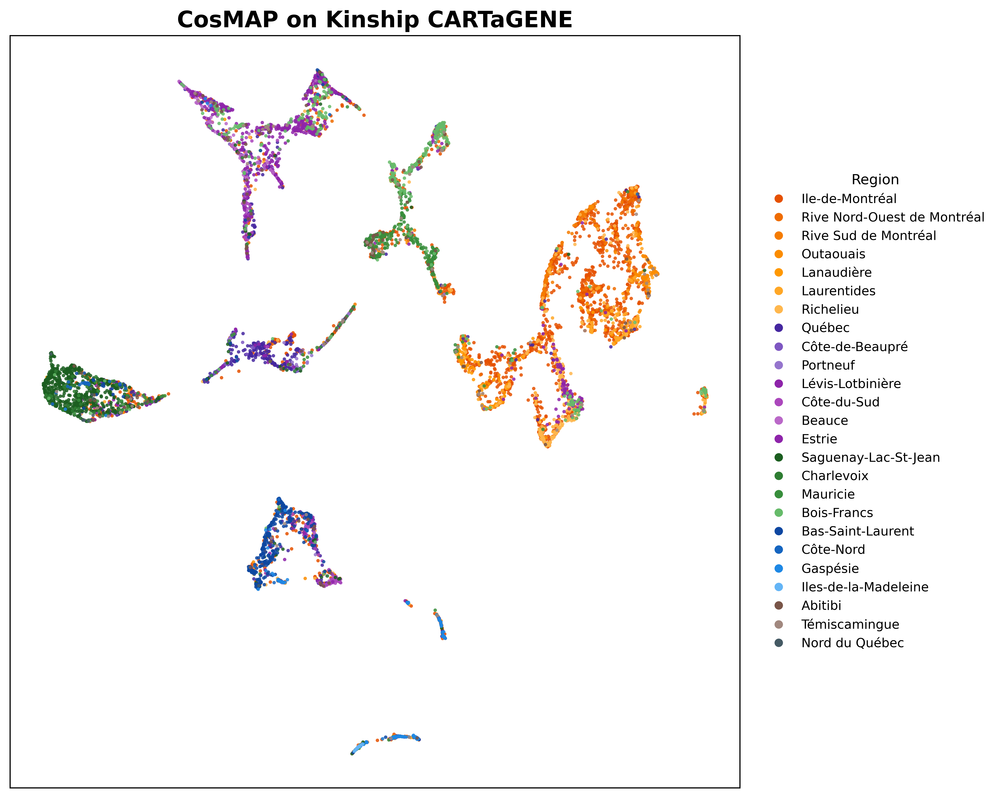

In [22]:
embedding_path = "/home/fenosoa/links/projects/rrg-amadou/fenosoa/CosMAP_benchmark_pipeline/__comparison_kinship_cartagene_seed_42/individual_embeddings/kinship_cartagene_cosmap_2d_seed42.npy"
labels_path = "/home/fenosoa/links/projects/def-amadou/fenosoa/data_benchmark/kinship_cartagene_labels.npy"
# embeddings_dict = np.load('__comparison_kinship_cartagene_seed_42/all_embeddings_dict_42_kinship_cartagene.npy', allow_pickle=True).item()


fig, ax, saved_path = plot_2d_embedding(
    # embedding_input=embeddings_dict["cosmap_2d"], X_embedded
    embedding_input= X_embedded,
    labels_input=labels_path,
    data_name="Kinship CARTaGENE",
    method_name="CosMAP",
    custom_colors=KINSHIP_COLORS,
    labels_name="Region",
    exclude_labels=["Unknown"],
    show_legend=True,
    show_legend_title=True,
    point_size=6,
    dpi=700,
    output_dir="figures_CosMAP/euclidean",
)

In [25]:
np.save('figures_CosMAP/euclidean/cosmap2d_kinhsip_eucldian.npy', X_embedded, allow_pickle=True)

In [26]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D


# ============================================================
# 1. Helpers
# ============================================================

def load_if_path(x):
    """
    Accept either:
    - path to .npy file
    - direct numpy array
    """
    if isinstance(x, str):
        return np.load(x, allow_pickle=True)
    return np.asarray(x)


def build_color_mapping(labels, custom_colors=None, cmap_name=None):
    """
    Build label-to-color mapping.

    If custom_colors is given:
        - preserve the order of custom_colors
        - add missing labels at the end using automatic colors

    If custom_colors is None:
        - preserve order of first appearance in labels
    """
    labels = np.asarray(labels)
    unique_labels = list(dict.fromkeys(labels))

    if custom_colors is not None:
        color_mapping = {}

        # Preserve custom color dictionary order
        for label in custom_colors.keys():
            if label in unique_labels:
                color_mapping[label] = custom_colors[label]

        # Add labels found in data but absent from custom_colors
        missing_labels = [label for label in unique_labels if label not in color_mapping]

        if len(missing_labels) > 0:
            if cmap_name is None:
                if len(missing_labels) <= 10:
                    cmap_name = "tab10"
                elif len(missing_labels) <= 20:
                    cmap_name = "tab20"
                else:
                    cmap_name = "turbo"

            cmap = plt.get_cmap(cmap_name, len(missing_labels))

            for i, label in enumerate(missing_labels):
                color_mapping[label] = cmap(i)

        return color_mapping

    # Automatic colors
    n_labels = len(unique_labels)

    if cmap_name is None:
        if n_labels <= 10:
            cmap_name = "tab10"
        elif n_labels <= 20:
            cmap_name = "tab20"
        else:
            cmap_name = "turbo"

    cmap = plt.get_cmap(cmap_name, n_labels)

    return {
        label: cmap(i)
        for i, label in enumerate(unique_labels)
    }


def plot_embedding_on_axis(
    ax,
    embedding,
    labels,
    color_mapping,
    legend_labels,
    title,
    point_size=6,
    alpha=0.85,
    axis_off=True,
):
    """
    Plot one 2D embedding on a given matplotlib axis.
    """

    for label in legend_labels:
        mask = labels == label

        if np.sum(mask) == 0:
            continue

        ax.scatter(
            embedding[mask, 0],
            embedding[mask, 1],
            s=point_size,
            c=[color_mapping[label]],
            alpha=alpha,
            linewidths=0,
        )

    ax.set_title(title, fontsize=13, fontweight="bold")

    if axis_off:
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel("")
        ax.set_ylabel("")
    else:
        ax.set_xlabel("Dimension 1")
        ax.set_ylabel("Dimension 2")


# ============================================================
# 2. Main CosMAP comparison function
# ============================================================

def run_and_plot_cosmap_metric_comparison(
    X_input,
    labels_input,
    CosMAP_class,
    custom_colors,
    n_neighbors_list=(10, 15, 30),
    metrics=("cosine", "euclidean"),
    temperature=0.5,
    random_state=2025,
    n_components=2,
    deterministic=False,
    verbose=1,
    use_gpu=True,
    optimizer_backend="torch_manual",
    faiss_backend="auto",
    refinement=True,
    data_name="Kinship CARTaGENE",
    labels_name="Region",
    exclude_labels=("Unknown",),
    show_legend=True,
    show_legend_title=True,
    point_size=6,
    alpha=0.85,
    figure_size=(12, 15),
    dpi=700,
    save_plot=True,
    output_dir="figures_CosMAP/metric_comparison",
    output_filename="cosmap_cosine_vs_euclidean_neighbors_comparison.png",
    save_embeddings=True,
    show_plot=True,
):
    """
    Run CosMAP several times and compare metrics.

    Layout:
        rows    = n_neighbors values
        columns = metrics, e.g. cosine vs euclidean

    Parameters
    ----------
    X_input : str or np.ndarray
        Path to high-dimensional X .npy file or direct array.

    labels_input : str or np.ndarray
        Path to labels .npy file or direct labels array.

    CosMAP_class : class
        Your CosMAP class.
        Example:
            from cosmap import CosMAP
            CosMAP_class=CosMAP

    custom_colors : dict
        Label-to-color dictionary, e.g. KINSHIP_COLORS.

    exclude_labels : list/tuple/set
        Labels to completely remove from plot and legend.
        Example:
            exclude_labels=["Unknown"]
    """

    os.makedirs(output_dir, exist_ok=True)

    # Load X and labels
    X = load_if_path(X_input)
    labels = load_if_path(labels_input)

    labels = np.asarray(labels)

    if X.shape[0] != labels.shape[0]:
        raise ValueError(
            f"X and labels have different numbers of samples: "
            f"{X.shape[0]} vs {labels.shape[0]}"
        )

    # Remove excluded labels before running/plotting
    # This means Unknown is not used in CosMAP fit_transform either.
    if exclude_labels is None:
        exclude_labels = []

    exclude_labels = set(exclude_labels)

    keep_mask = np.array([label not in exclude_labels for label in labels])

    X_plot = X[keep_mask]
    labels_plot = labels[keep_mask]

    if X_plot.shape[0] == 0:
        raise ValueError("No samples left after applying exclude_labels.")

    # Build color mapping after exclusion
    color_mapping = build_color_mapping(
        labels=labels_plot,
        custom_colors=custom_colors,
    )

    # Legend follows KINSHIP_COLORS order, not alphabetical order
    legend_labels = [
        label for label in color_mapping.keys()
        if np.sum(labels_plot == label) > 0
    ]

    n_rows = len(n_neighbors_list)
    n_cols = len(metrics)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=figure_size,
        dpi=dpi,
        squeeze=False,
    )

    embeddings_results = {}

    # Run CosMAP for each combination
    for i, n_neighbors in enumerate(n_neighbors_list):
        for j, metric in enumerate(metrics):

            print("=" * 80)
            print(f"Running CosMAP | metric={metric} | n_neighbors={n_neighbors}")
            print("=" * 80)

            cosmap_ = CosMAP_class(
                n_components=n_components,
                n_neighbors=n_neighbors,
                temperature=temperature,
                random_state=random_state,
                deterministic=deterministic,
                verbose=verbose,
                use_gpu=use_gpu,
                optimizer_backend=optimizer_backend,
                faiss_backend=faiss_backend,
                refinement=refinement,
                metric=metric,
            )

            X_embedded = cosmap_.fit_transform(X_plot)

            key = f"cosmap_{metric}_k{n_neighbors}"
            embeddings_results[key] = X_embedded

            if save_embeddings:
                emb_path = os.path.join(output_dir, f"{key}.npy")
                np.save(emb_path, X_embedded)
                print(f"Saved embedding: {emb_path}")

            ax = axes[i, j]

            title = f"{metric.capitalize()} | n_neighbors={n_neighbors}"

            plot_embedding_on_axis(
                ax=ax,
                embedding=X_embedded,
                labels=labels_plot,
                color_mapping=color_mapping,
                legend_labels=legend_labels,
                title=title,
                point_size=point_size,
                alpha=alpha,
                axis_off=True,
            )

    # Global title
    fig.suptitle(
        f"CosMAP metric comparison on {data_name}",
        fontsize=18,
        fontweight="bold",
        y=0.995,
    )

    # Shared legend
    if show_legend:
        handles = [
            Line2D(
                [0],
                [0],
                marker="o",
                color="w",
                label=str(label),
                markerfacecolor=color_mapping[label],
                markersize=7,
            )
            for label in legend_labels
        ]

        legend_title = labels_name if show_legend_title else None

        fig.legend(
            handles=handles,
            title=legend_title,
            loc="center left",
            bbox_to_anchor=(1.01, 0.5),
            frameon=False,
            fontsize=9,
            title_fontsize=10,
        )

    plt.tight_layout(rect=[0, 0, 0.88, 0.97])

    saved_path = None

    if save_plot:
        saved_path = os.path.join(output_dir, output_filename)

        fig.savefig(
            saved_path,
            dpi=dpi,
            bbox_inches="tight",
        )

        print(f"Saved figure: {saved_path}")

    if show_plot:
        plt.show()
    else:
        plt.close(fig)

    return fig, axes, embeddings_results, saved_path

In [27]:
# Your paths
X_path = "/home/fenosoa/links/projects/def-amadou/fenosoa/data_benchmark/kinship_cartagene.npy"
labels_path = "/home/fenosoa/links/projects/def-amadou/fenosoa/data_benchmark/kinship_cartagene_labels.npy"

fig, axes, embeddings_results, saved_path = run_and_plot_cosmap_metric_comparison(
    X_input=X_path,
    labels_input=labels_path,
    CosMAP_class=CosMAP,
    custom_colors=KINSHIP_COLORS,

    n_neighbors_list=(10, 15, 30),
    metrics=("cosine", "euclidean"),

    temperature=0.5,
    random_state=2025,
    n_components=2,

    deterministic=False,
    verbose=1,
    use_gpu=True,
    optimizer_backend="torch_manual",
    faiss_backend="auto",
    refinement=True,

    data_name="Kinship CARTaGENE",
    labels_name="Region",
    exclude_labels=["Unknown"],

    show_legend=True,
    show_legend_title=True,

    point_size=6,
    alpha=0.85,
    figure_size=(12, 15),
    dpi=700,

    save_plot=True,
    output_dir="figures_CosMAP/metric_comparison",
    output_filename="cosmap_cosine_vs_euclidean_neighbors_comparison.png",

    save_embeddings=True,
    show_plot=True,
)

Running CosMAP | metric=cosine | n_neighbors=10
2026-06-04 12:58:30 Starting two-phase CosMAP refinement
2026-06-04 12:58:30 Phase 1: input 8408D -> 30D | n_neighbors=10 | n_epochs=500
2026-06-04 12:58:30 Computing CosMAP similarity graph
2026-06-04 12:58:30 FAISS found: /cvmfs/soft.computecanada.ca/easybuild/software/2023/x86-64-v4/CUDA/gcc12/cuda12.6/faiss/1.12.0/lib/python3.11/site-packages/faiss/__init__.py
2026-06-04 12:58:30 FAISS version: 1.12.0
2026-06-04 12:58:30 FAISS GPU support: True
2026-06-04 12:58:30 FAISS CPU IndexFlatIP support: True
2026-06-04 12:58:31 Normalizing input data on cuda
2026-06-04 12:58:32 Finding k-nearest neighbors
2026-06-04 12:58:32 Using FAISS GPU IndexFlatIP
2026-06-04 12:58:32 Building sparse temperature-softmax graph


Computing similarities: 100%|████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 46.73it/s]


2026-06-04 12:58:33 Fitting low-dimensional kernel parameters
2026-06-04 12:58:33 Selected torch device: cuda
2026-06-04 12:58:33 Optimizing embedding with backend='torch_manual'
2026-06-04 12:58:39 Starting torch_manual optimization on cuda
2026-06-04 12:58:39 n_vertices=7878, n_edges=130800, n_epochs=500
2026-06-04 12:58:40 Epoch    1/500 | alpha=1.000000 | device=cuda
2026-06-04 12:58:40 Epoch   50/500 | alpha=0.902000 | device=cuda
2026-06-04 12:58:40 Epoch  100/500 | alpha=0.802000 | device=cuda
2026-06-04 12:58:40 Epoch  150/500 | alpha=0.702000 | device=cuda
2026-06-04 12:58:40 Epoch  200/500 | alpha=0.602000 | device=cuda
2026-06-04 12:58:40 Epoch  250/500 | alpha=0.502000 | device=cuda
2026-06-04 12:58:40 Epoch  300/500 | alpha=0.402000 | device=cuda
2026-06-04 12:58:40 Epoch  350/500 | alpha=0.302000 | device=cuda
2026-06-04 12:58:40 Epoch  400/500 | alpha=0.202000 | device=cuda
2026-06-04 12:58:40 Epoch  450/500 | alpha=0.102000 | device=cuda
2026-06-04 12:58:40 Epoch  500/5

Computing similarities: 100%|██████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3059.02it/s]


2026-06-04 12:58:41 Fitting low-dimensional kernel parameters
2026-06-04 12:58:41 Selected torch device: cuda
2026-06-04 12:58:41 Optimizing embedding with backend='torch_manual'
2026-06-04 12:58:41 Starting torch_manual optimization on cuda
2026-06-04 12:58:41 n_vertices=7878, n_edges=320477, n_epochs=125
2026-06-04 12:58:41 Epoch    1/125 | alpha=1.000000 | device=cuda
2026-06-04 12:58:41 Epoch   12/125 | alpha=0.912000 | device=cuda
2026-06-04 12:58:41 Epoch   24/125 | alpha=0.816000 | device=cuda
2026-06-04 12:58:41 Epoch   36/125 | alpha=0.720000 | device=cuda
2026-06-04 12:58:41 Epoch   48/125 | alpha=0.624000 | device=cuda
2026-06-04 12:58:42 Epoch   60/125 | alpha=0.528000 | device=cuda
2026-06-04 12:58:42 Epoch   72/125 | alpha=0.432000 | device=cuda
2026-06-04 12:58:42 Epoch   84/125 | alpha=0.336000 | device=cuda
2026-06-04 12:58:42 Epoch   96/125 | alpha=0.240000 | device=cuda
2026-06-04 12:58:42 Epoch  108/125 | alpha=0.144000 | device=cuda
2026-06-04 12:58:42 Epoch  120/1

Computing similarities: 100%|███████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 168.17it/s]


2026-06-04 12:58:43 Fitting low-dimensional kernel parameters
2026-06-04 12:58:43 Selected torch device: cuda
2026-06-04 12:58:43 Optimizing embedding with backend='torch_manual'
2026-06-04 12:58:49 Starting torch_manual optimization on cuda
2026-06-04 12:58:49 n_vertices=7878, n_edges=112860, n_epochs=500
2026-06-04 12:58:49 Epoch    1/500 | alpha=1.000000 | device=cuda
2026-06-04 12:58:50 Epoch   50/500 | alpha=0.902000 | device=cuda
2026-06-04 12:58:50 Epoch  100/500 | alpha=0.802000 | device=cuda
2026-06-04 12:58:50 Epoch  150/500 | alpha=0.702000 | device=cuda
2026-06-04 12:58:50 Epoch  200/500 | alpha=0.602000 | device=cuda
2026-06-04 12:58:50 Epoch  250/500 | alpha=0.502000 | device=cuda
2026-06-04 12:58:50 Epoch  300/500 | alpha=0.402000 | device=cuda
2026-06-04 12:58:50 Epoch  350/500 | alpha=0.302000 | device=cuda
2026-06-04 12:58:50 Epoch  400/500 | alpha=0.202000 | device=cuda
2026-06-04 12:58:50 Epoch  450/500 | alpha=0.102000 | device=cuda
2026-06-04 12:58:50 Epoch  500/5

Computing similarities: 100%|██████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 2026.36it/s]


2026-06-04 12:58:51 Fitting low-dimensional kernel parameters
2026-06-04 12:58:51 Selected torch device: cuda
2026-06-04 12:58:51 Optimizing embedding with backend='torch_manual'
2026-06-04 12:58:51 Starting torch_manual optimization on cuda
2026-06-04 12:58:51 n_vertices=7878, n_edges=305454, n_epochs=125
2026-06-04 12:58:51 Epoch    1/125 | alpha=1.000000 | device=cuda
2026-06-04 12:58:51 Epoch   12/125 | alpha=0.912000 | device=cuda
2026-06-04 12:58:51 Epoch   24/125 | alpha=0.816000 | device=cuda
2026-06-04 12:58:51 Epoch   36/125 | alpha=0.720000 | device=cuda
2026-06-04 12:58:51 Epoch   48/125 | alpha=0.624000 | device=cuda
2026-06-04 12:58:51 Epoch   60/125 | alpha=0.528000 | device=cuda
2026-06-04 12:58:51 Epoch   72/125 | alpha=0.432000 | device=cuda
2026-06-04 12:58:51 Epoch   84/125 | alpha=0.336000 | device=cuda
2026-06-04 12:58:51 Epoch   96/125 | alpha=0.240000 | device=cuda
2026-06-04 12:58:51 Epoch  108/125 | alpha=0.144000 | device=cuda
2026-06-04 12:58:51 Epoch  120/1

Computing similarities: 100%|████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 57.54it/s]


2026-06-04 12:58:53 Fitting low-dimensional kernel parameters
2026-06-04 12:58:53 Selected torch device: cuda
2026-06-04 12:58:53 Optimizing embedding with backend='torch_manual'
2026-06-04 12:59:00 Starting torch_manual optimization on cuda
2026-06-04 12:59:00 n_vertices=7878, n_edges=200988, n_epochs=500
2026-06-04 12:59:00 Epoch    1/500 | alpha=1.000000 | device=cuda
2026-06-04 12:59:00 Epoch   50/500 | alpha=0.902000 | device=cuda
2026-06-04 12:59:01 Epoch  100/500 | alpha=0.802000 | device=cuda
2026-06-04 12:59:01 Epoch  150/500 | alpha=0.702000 | device=cuda
2026-06-04 12:59:01 Epoch  200/500 | alpha=0.602000 | device=cuda
2026-06-04 12:59:01 Epoch  250/500 | alpha=0.502000 | device=cuda
2026-06-04 12:59:01 Epoch  300/500 | alpha=0.402000 | device=cuda
2026-06-04 12:59:01 Epoch  350/500 | alpha=0.302000 | device=cuda
2026-06-04 12:59:01 Epoch  400/500 | alpha=0.202000 | device=cuda
2026-06-04 12:59:02 Epoch  450/500 | alpha=0.102000 | device=cuda
2026-06-04 12:59:02 Epoch  500/5

Computing similarities: 100%|██████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3049.85it/s]


2026-06-04 12:59:03 Fitting low-dimensional kernel parameters
2026-06-04 12:59:03 Selected torch device: cuda
2026-06-04 12:59:03 Optimizing embedding with backend='torch_manual'
2026-06-04 12:59:03 Starting torch_manual optimization on cuda
2026-06-04 12:59:03 n_vertices=7878, n_edges=322537, n_epochs=125
2026-06-04 12:59:03 Epoch    1/125 | alpha=1.000000 | device=cuda
2026-06-04 12:59:03 Epoch   12/125 | alpha=0.912000 | device=cuda
2026-06-04 12:59:03 Epoch   24/125 | alpha=0.816000 | device=cuda
2026-06-04 12:59:03 Epoch   36/125 | alpha=0.720000 | device=cuda
2026-06-04 12:59:03 Epoch   48/125 | alpha=0.624000 | device=cuda
2026-06-04 12:59:03 Epoch   60/125 | alpha=0.528000 | device=cuda
2026-06-04 12:59:03 Epoch   72/125 | alpha=0.432000 | device=cuda
2026-06-04 12:59:03 Epoch   84/125 | alpha=0.336000 | device=cuda
2026-06-04 12:59:03 Epoch   96/125 | alpha=0.240000 | device=cuda
2026-06-04 12:59:03 Epoch  108/125 | alpha=0.144000 | device=cuda
2026-06-04 12:59:03 Epoch  120/1

Computing similarities: 100%|███████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 544.41it/s]


2026-06-04 12:59:04 Fitting low-dimensional kernel parameters
2026-06-04 12:59:04 Selected torch device: cuda
2026-06-04 12:59:04 Optimizing embedding with backend='torch_manual'
2026-06-04 12:59:11 Starting torch_manual optimization on cuda
2026-06-04 12:59:11 n_vertices=7878, n_edges=172270, n_epochs=500
2026-06-04 12:59:11 Epoch    1/500 | alpha=1.000000 | device=cuda
2026-06-04 12:59:11 Epoch   50/500 | alpha=0.902000 | device=cuda
2026-06-04 12:59:11 Epoch  100/500 | alpha=0.802000 | device=cuda
2026-06-04 12:59:11 Epoch  150/500 | alpha=0.702000 | device=cuda
2026-06-04 12:59:11 Epoch  200/500 | alpha=0.602000 | device=cuda
2026-06-04 12:59:12 Epoch  250/500 | alpha=0.502000 | device=cuda
2026-06-04 12:59:12 Epoch  300/500 | alpha=0.402000 | device=cuda
2026-06-04 12:59:12 Epoch  350/500 | alpha=0.302000 | device=cuda
2026-06-04 12:59:12 Epoch  400/500 | alpha=0.202000 | device=cuda
2026-06-04 12:59:12 Epoch  450/500 | alpha=0.102000 | device=cuda
2026-06-04 12:59:12 Epoch  500/5

Computing similarities: 100%|██████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 2035.33it/s]


2026-06-04 12:59:13 Fitting low-dimensional kernel parameters
2026-06-04 12:59:13 Selected torch device: cuda
2026-06-04 12:59:13 Optimizing embedding with backend='torch_manual'
2026-06-04 12:59:13 Starting torch_manual optimization on cuda
2026-06-04 12:59:13 n_vertices=7878, n_edges=306127, n_epochs=125
2026-06-04 12:59:13 Epoch    1/125 | alpha=1.000000 | device=cuda
2026-06-04 12:59:13 Epoch   12/125 | alpha=0.912000 | device=cuda
2026-06-04 12:59:13 Epoch   24/125 | alpha=0.816000 | device=cuda
2026-06-04 12:59:13 Epoch   36/125 | alpha=0.720000 | device=cuda
2026-06-04 12:59:13 Epoch   48/125 | alpha=0.624000 | device=cuda
2026-06-04 12:59:13 Epoch   60/125 | alpha=0.528000 | device=cuda
2026-06-04 12:59:13 Epoch   72/125 | alpha=0.432000 | device=cuda
2026-06-04 12:59:13 Epoch   84/125 | alpha=0.336000 | device=cuda
2026-06-04 12:59:13 Epoch   96/125 | alpha=0.240000 | device=cuda
2026-06-04 12:59:13 Epoch  108/125 | alpha=0.144000 | device=cuda
2026-06-04 12:59:13 Epoch  120/1

Computing similarities: 100%|███████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 417.45it/s]


2026-06-04 12:59:15 Fitting low-dimensional kernel parameters
2026-06-04 12:59:15 Selected torch device: cuda
2026-06-04 12:59:15 Optimizing embedding with backend='torch_manual'
2026-06-04 12:59:22 Starting torch_manual optimization on cuda
2026-06-04 12:59:22 n_vertices=7878, n_edges=416742, n_epochs=500
2026-06-04 12:59:22 Epoch    1/500 | alpha=1.000000 | device=cuda
2026-06-04 12:59:22 Epoch   50/500 | alpha=0.902000 | device=cuda
2026-06-04 12:59:22 Epoch  100/500 | alpha=0.802000 | device=cuda
2026-06-04 12:59:22 Epoch  150/500 | alpha=0.702000 | device=cuda
2026-06-04 12:59:23 Epoch  200/500 | alpha=0.602000 | device=cuda
2026-06-04 12:59:23 Epoch  250/500 | alpha=0.502000 | device=cuda
2026-06-04 12:59:23 Epoch  300/500 | alpha=0.402000 | device=cuda
2026-06-04 12:59:23 Epoch  350/500 | alpha=0.302000 | device=cuda
2026-06-04 12:59:24 Epoch  400/500 | alpha=0.202000 | device=cuda
2026-06-04 12:59:24 Epoch  450/500 | alpha=0.102000 | device=cuda
2026-06-04 12:59:24 Epoch  500/5

Computing similarities: 100%|██████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 3140.62it/s]


2026-06-04 12:59:25 Fitting low-dimensional kernel parameters
2026-06-04 12:59:25 Selected torch device: cuda
2026-06-04 12:59:25 Optimizing embedding with backend='torch_manual'
2026-06-04 12:59:25 Starting torch_manual optimization on cuda
2026-06-04 12:59:25 n_vertices=7878, n_edges=322566, n_epochs=125
2026-06-04 12:59:25 Epoch    1/125 | alpha=1.000000 | device=cuda
2026-06-04 12:59:25 Epoch   12/125 | alpha=0.912000 | device=cuda
2026-06-04 12:59:25 Epoch   24/125 | alpha=0.816000 | device=cuda
2026-06-04 12:59:25 Epoch   36/125 | alpha=0.720000 | device=cuda
2026-06-04 12:59:25 Epoch   48/125 | alpha=0.624000 | device=cuda
2026-06-04 12:59:25 Epoch   60/125 | alpha=0.528000 | device=cuda
2026-06-04 12:59:25 Epoch   72/125 | alpha=0.432000 | device=cuda
2026-06-04 12:59:25 Epoch   84/125 | alpha=0.336000 | device=cuda
2026-06-04 12:59:25 Epoch   96/125 | alpha=0.240000 | device=cuda
2026-06-04 12:59:25 Epoch  108/125 | alpha=0.144000 | device=cuda
2026-06-04 12:59:25 Epoch  120/1

Computing similarities: 100%|███████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 301.65it/s]


2026-06-04 12:59:27 Fitting low-dimensional kernel parameters
2026-06-04 12:59:27 Selected torch device: cuda
2026-06-04 12:59:27 Optimizing embedding with backend='torch_manual'
2026-06-04 12:59:34 Starting torch_manual optimization on cuda
2026-06-04 12:59:34 n_vertices=7878, n_edges=354562, n_epochs=500
2026-06-04 12:59:34 Epoch    1/500 | alpha=1.000000 | device=cuda
2026-06-04 12:59:34 Epoch   50/500 | alpha=0.902000 | device=cuda
2026-06-04 12:59:34 Epoch  100/500 | alpha=0.802000 | device=cuda
2026-06-04 12:59:34 Epoch  150/500 | alpha=0.702000 | device=cuda
2026-06-04 12:59:34 Epoch  200/500 | alpha=0.602000 | device=cuda
2026-06-04 12:59:35 Epoch  250/500 | alpha=0.502000 | device=cuda
2026-06-04 12:59:35 Epoch  300/500 | alpha=0.402000 | device=cuda
2026-06-04 12:59:35 Epoch  350/500 | alpha=0.302000 | device=cuda
2026-06-04 12:59:35 Epoch  400/500 | alpha=0.202000 | device=cuda
2026-06-04 12:59:35 Epoch  450/500 | alpha=0.102000 | device=cuda
2026-06-04 12:59:36 Epoch  500/5

Computing similarities: 100%|██████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 2061.46it/s]


2026-06-04 12:59:37 Fitting low-dimensional kernel parameters
2026-06-04 12:59:37 Selected torch device: cuda
2026-06-04 12:59:37 Optimizing embedding with backend='torch_manual'
2026-06-04 12:59:37 Starting torch_manual optimization on cuda
2026-06-04 12:59:37 n_vertices=7878, n_edges=309625, n_epochs=125
2026-06-04 12:59:37 Epoch    1/125 | alpha=1.000000 | device=cuda
2026-06-04 12:59:37 Epoch   12/125 | alpha=0.912000 | device=cuda
2026-06-04 12:59:37 Epoch   24/125 | alpha=0.816000 | device=cuda
2026-06-04 12:59:37 Epoch   36/125 | alpha=0.720000 | device=cuda
2026-06-04 12:59:37 Epoch   48/125 | alpha=0.624000 | device=cuda
2026-06-04 12:59:37 Epoch   60/125 | alpha=0.528000 | device=cuda
2026-06-04 12:59:37 Epoch   72/125 | alpha=0.432000 | device=cuda
2026-06-04 12:59:37 Epoch   84/125 | alpha=0.336000 | device=cuda
2026-06-04 12:59:37 Epoch   96/125 | alpha=0.240000 | device=cuda
2026-06-04 12:59:37 Epoch  108/125 | alpha=0.144000 | device=cuda
2026-06-04 12:59:37 Epoch  120/1